# Features without mask

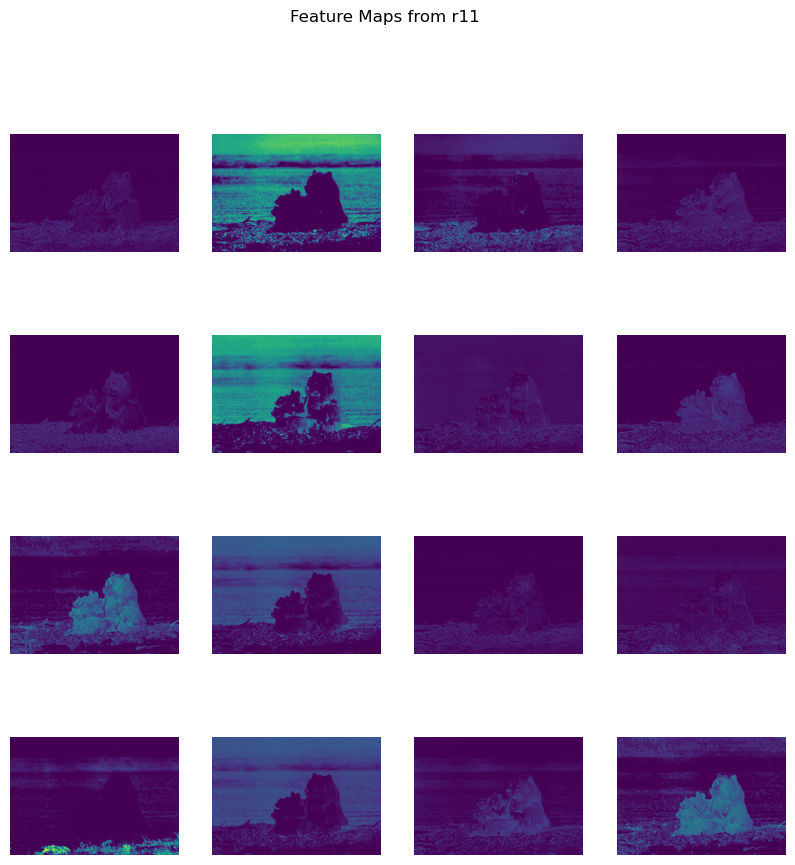

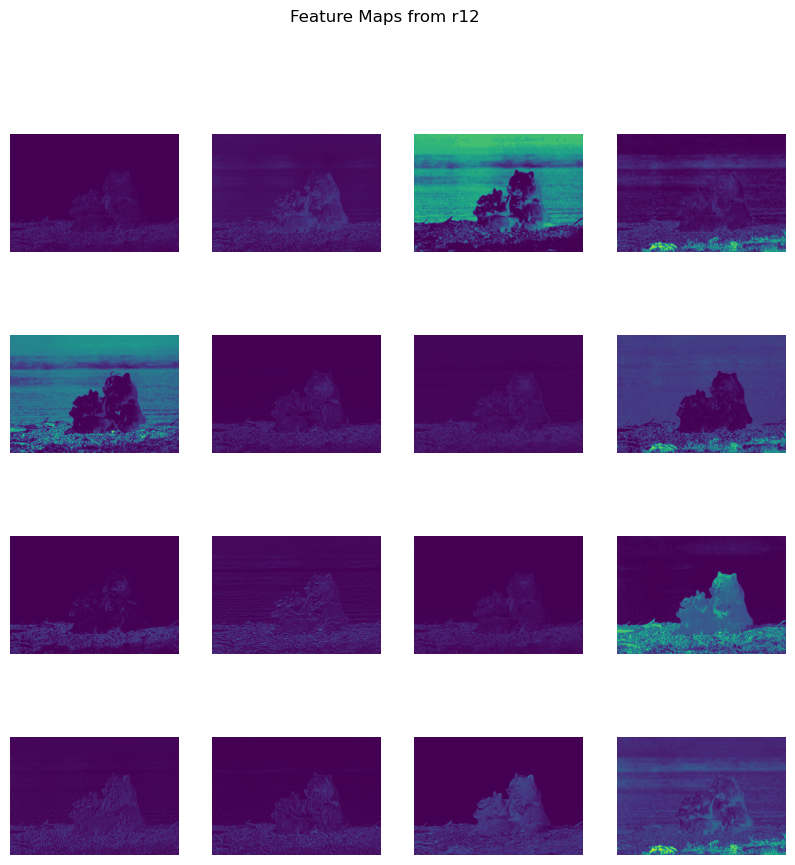

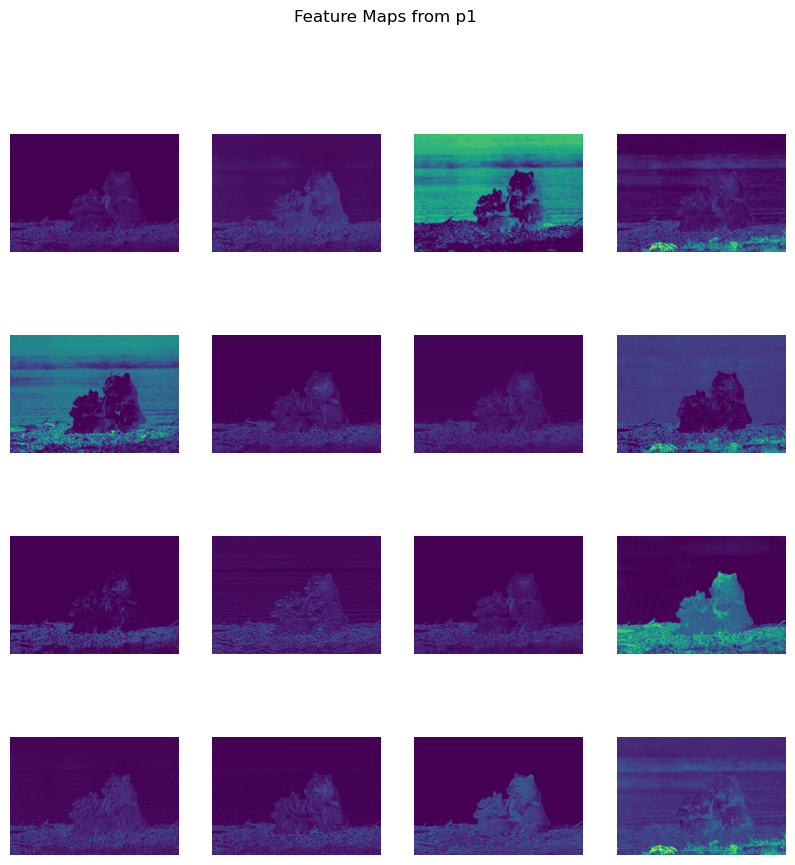

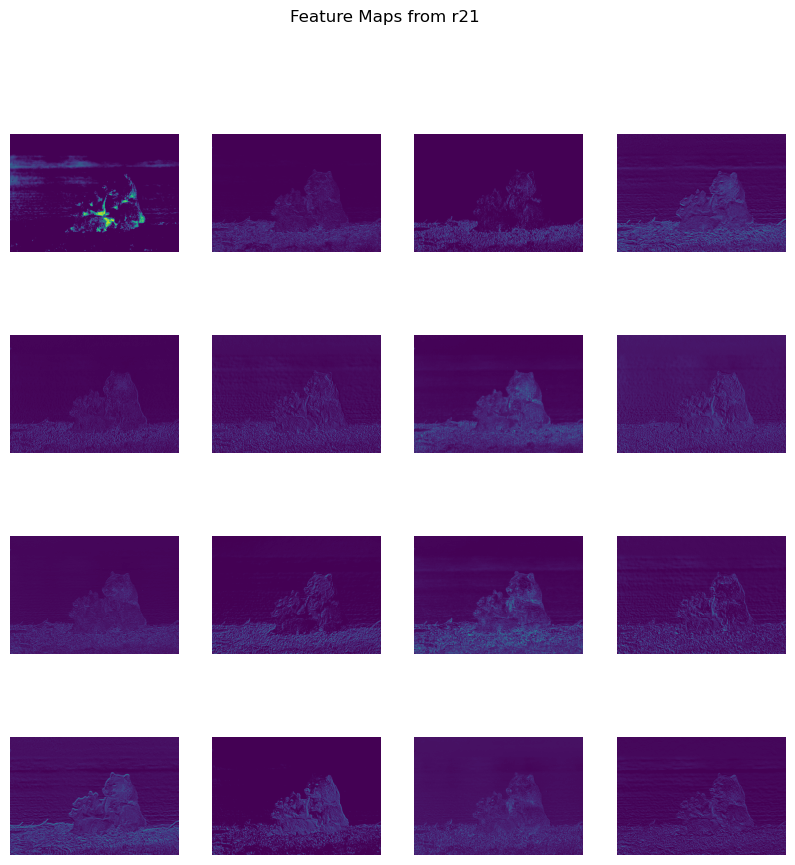

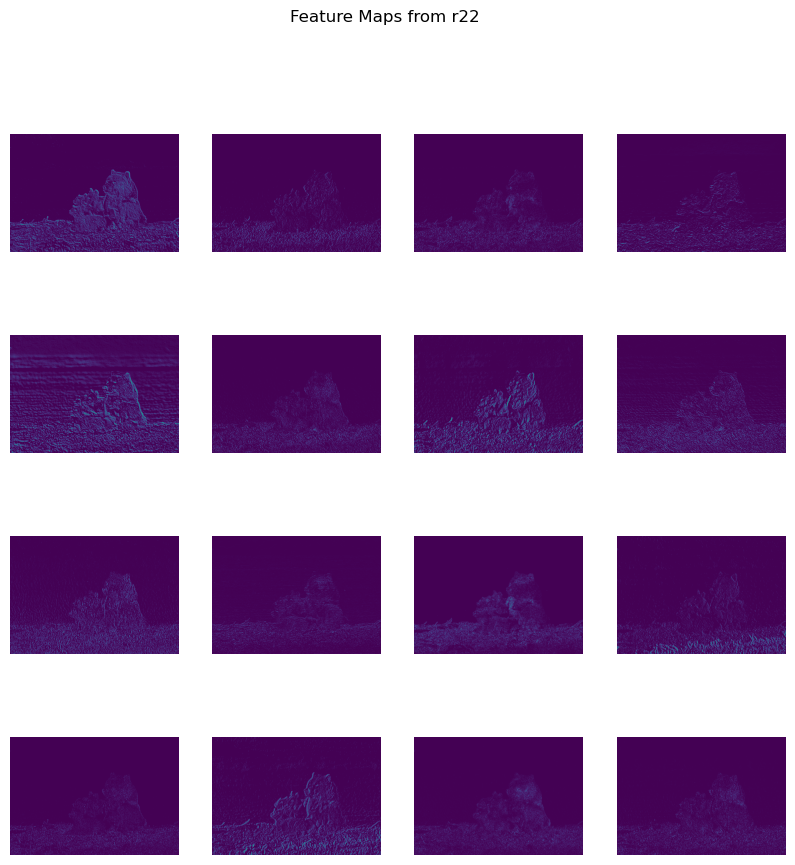

...

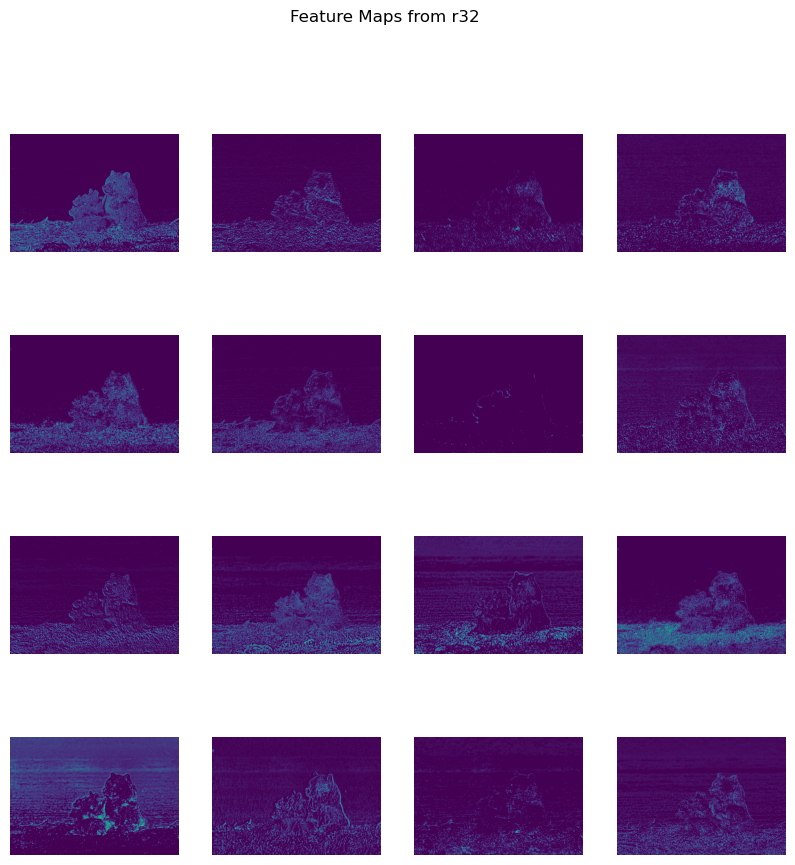

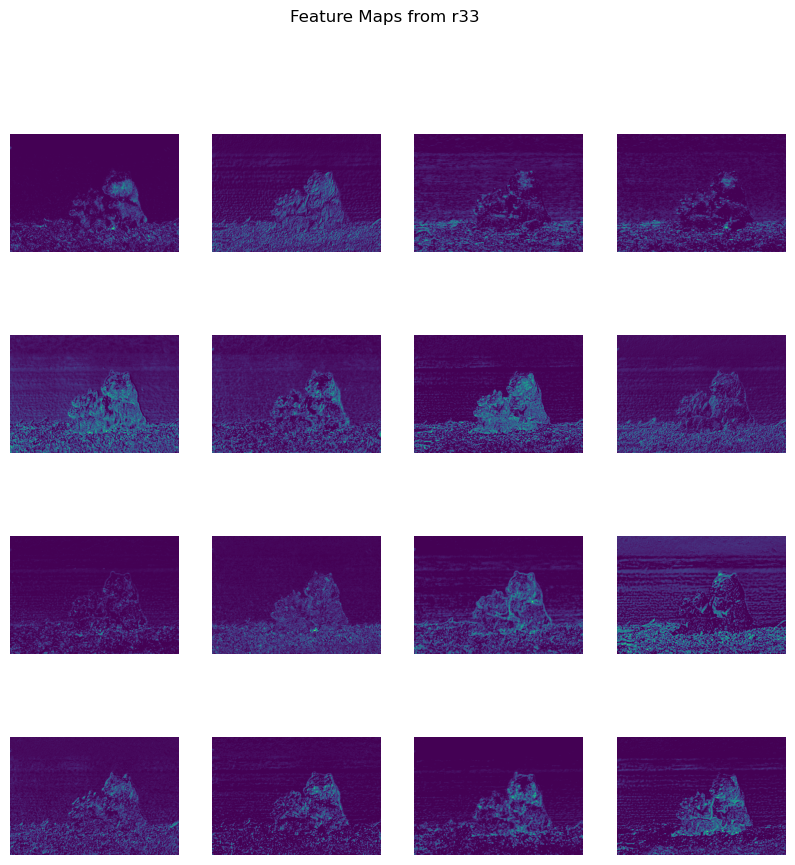

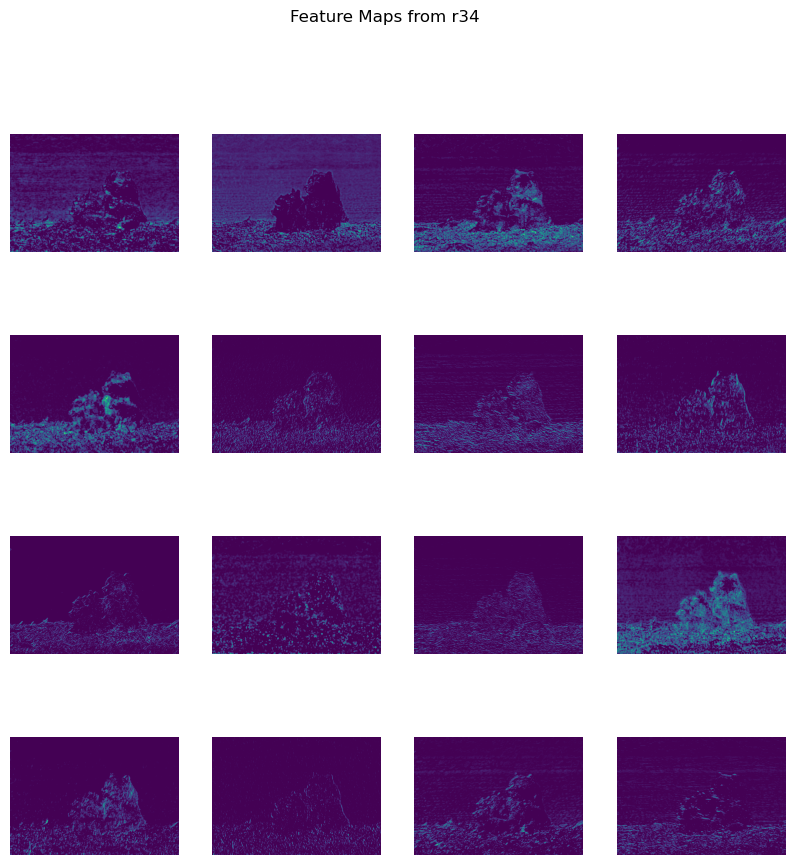

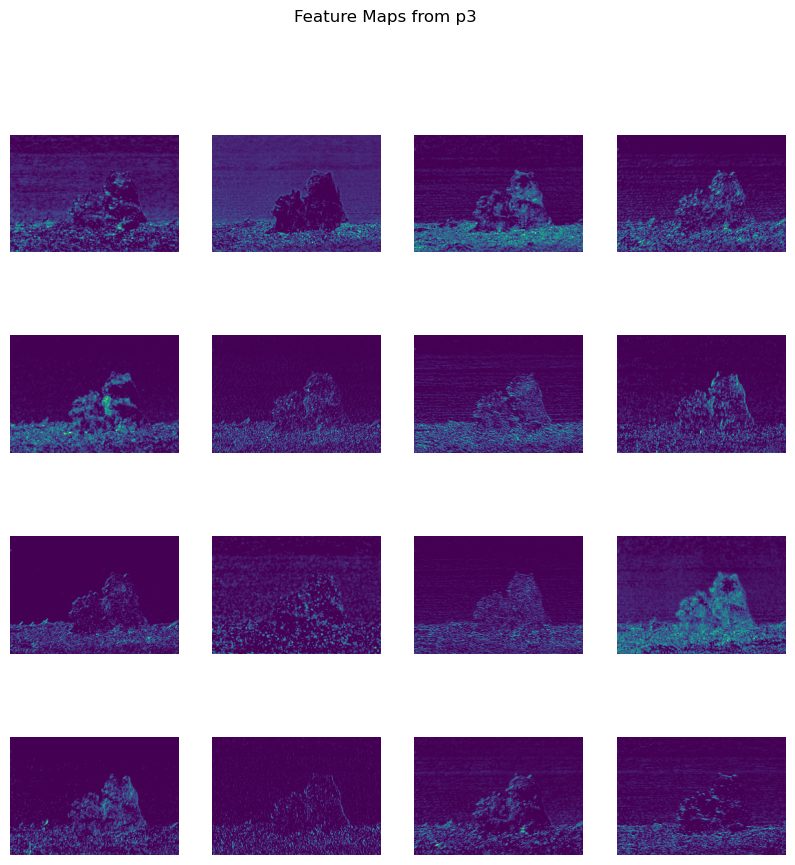

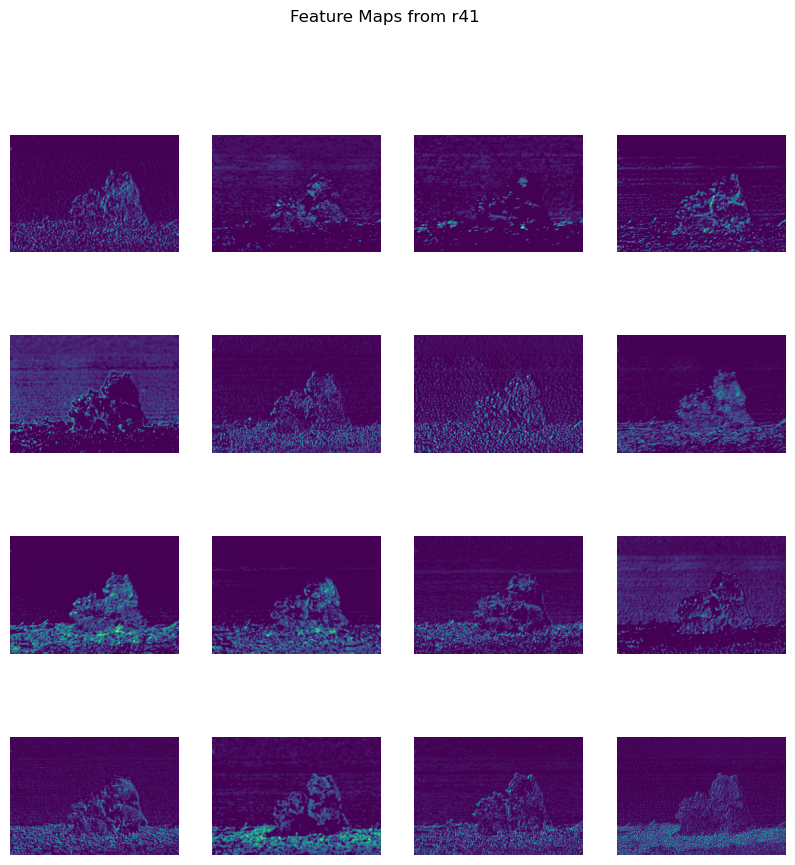

In [12]:
import torch
import torch.nn as nn
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from libs.models_masked import encoder4 as encoder_m, decoder4 as decoder_m

enc_ref_m = encoder_m()
enc_ref_m.load_state_dict(torch.load('models/vgg_r41.pth')) 
enc_ref_m.eval() 

def preprocess_image(image_path):
    preprocess = transforms.Compose([
        transforms.ToTensor(), 
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) 
    ])
    
    img = Image.open(image_path).convert('RGB')
    img_tensor = preprocess(img).unsqueeze(0) 
    return img_tensor

def plot_feature_maps(feature_maps, num_maps=16):
    for layer_name, feature_map in feature_maps.items():
        num_filters = feature_map.shape[1] 
        num_to_display = min(num_maps, num_filters)

        plt.figure(figsize=(10, 10))
        plt.suptitle(f"Feature Maps from {layer_name}")

        for i in range(num_to_display):
            ax = plt.subplot(4, 4, i + 1)
            plt.imshow(feature_map[0, i].cpu().detach().numpy(), cmap='viridis')
            plt.axis('off')
        plt.show()

def extract_features(image_tensor, encoder):
    with torch.no_grad():
        features, mask = encoder(image_tensor)
    return features

image_path = 'sources/image-2.png' 
input_image = preprocess_image(image_path)

features = extract_features(input_image, enc_ref_m)

plot_feature_maps(features, num_maps=16)

# Reconstruct Image from features

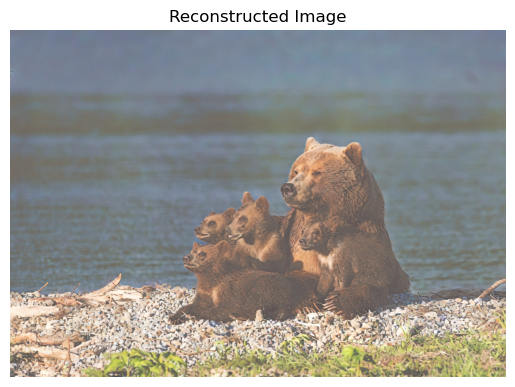

In [13]:
from libs.models_masked import decoder4 as decoder_m

dec_ref_m = decoder_m()
dec_ref_m.load_state_dict(torch.load('./models/dec_r41.pth'))

def deprocess_image(image_tensor):
    img = image_tensor.clone().detach()
    img = img.squeeze(0)  
    img = img.permute(1, 2, 0).cpu().numpy() 
    img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406]) 
    img = np.clip(img, 0, 1)
    return img

def plot_image(image_tensor, title="Image"):
    img = deprocess_image(image_tensor)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

with torch.no_grad():
    reconstructed_image = dec_ref_m(features['r41'])  

plot_image(reconstructed_image, title="Reconstructed Image")

# Features with mask

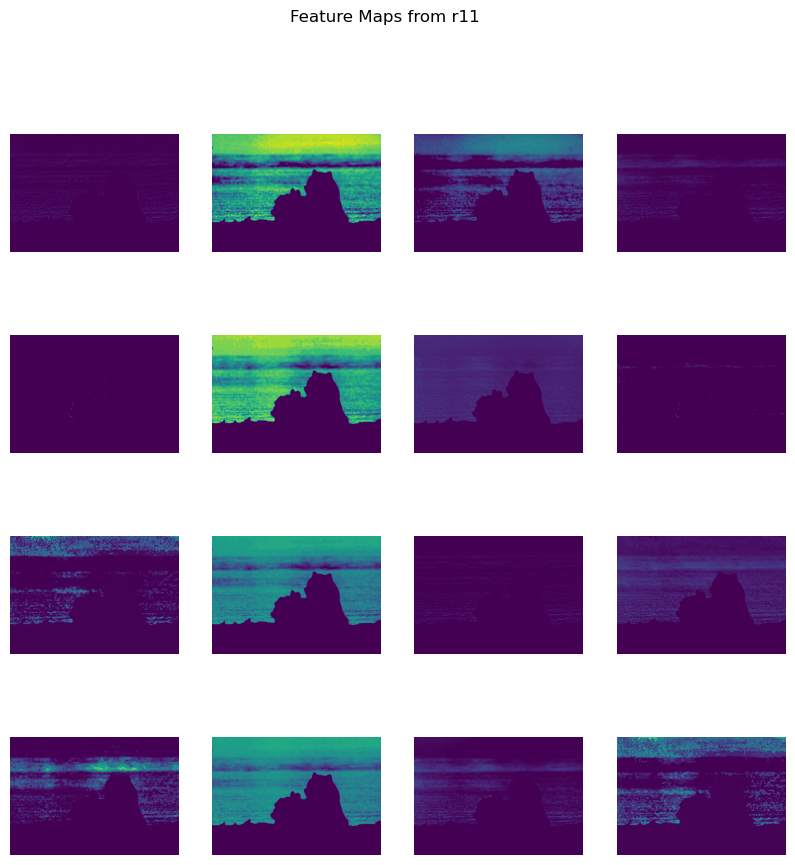

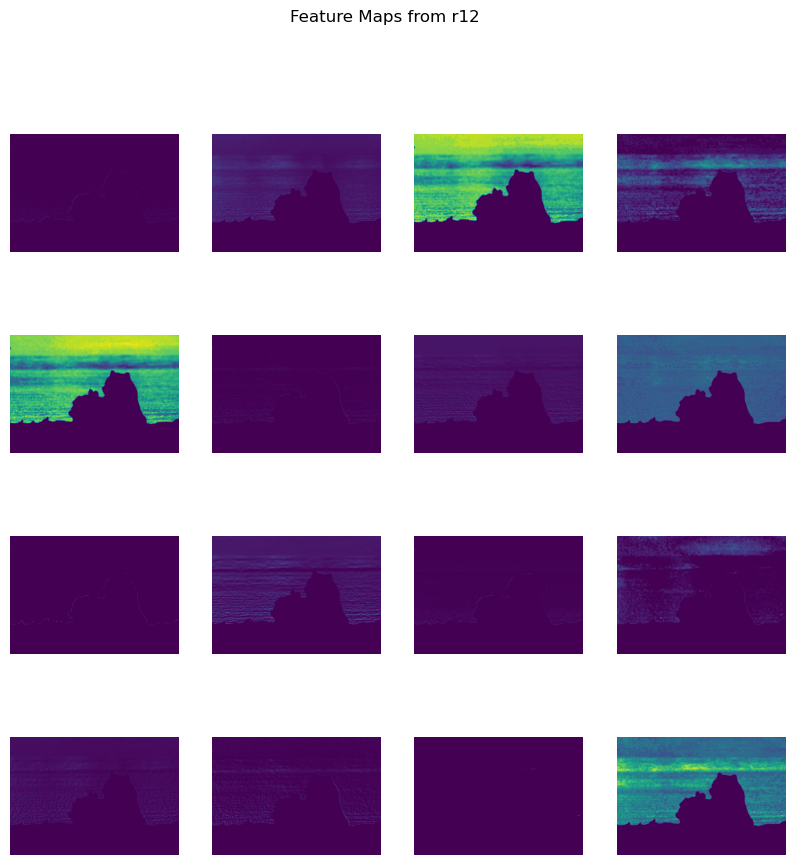

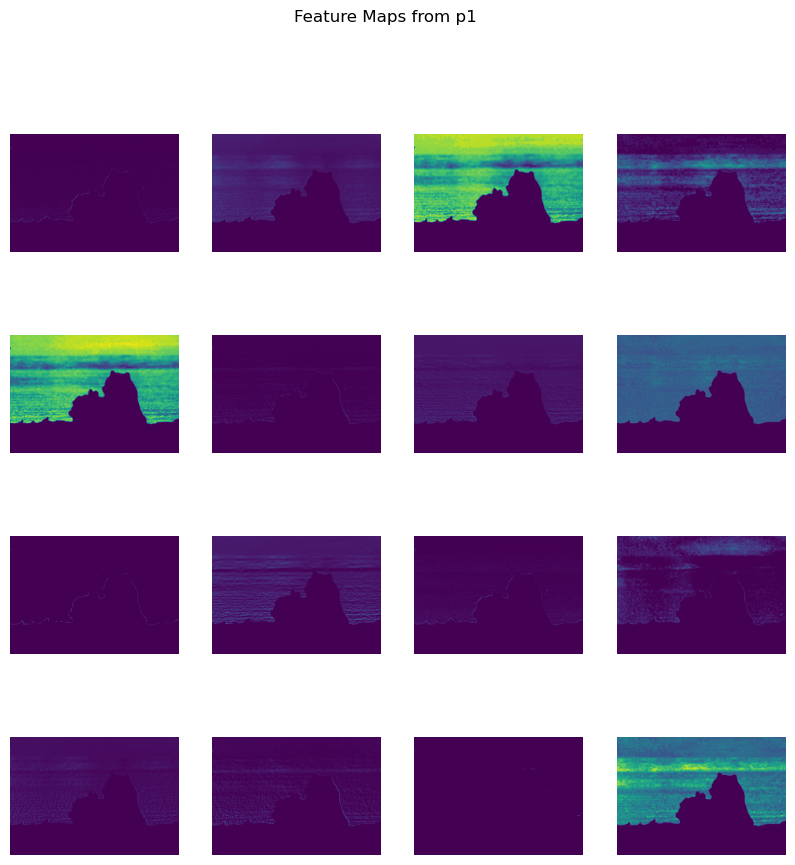

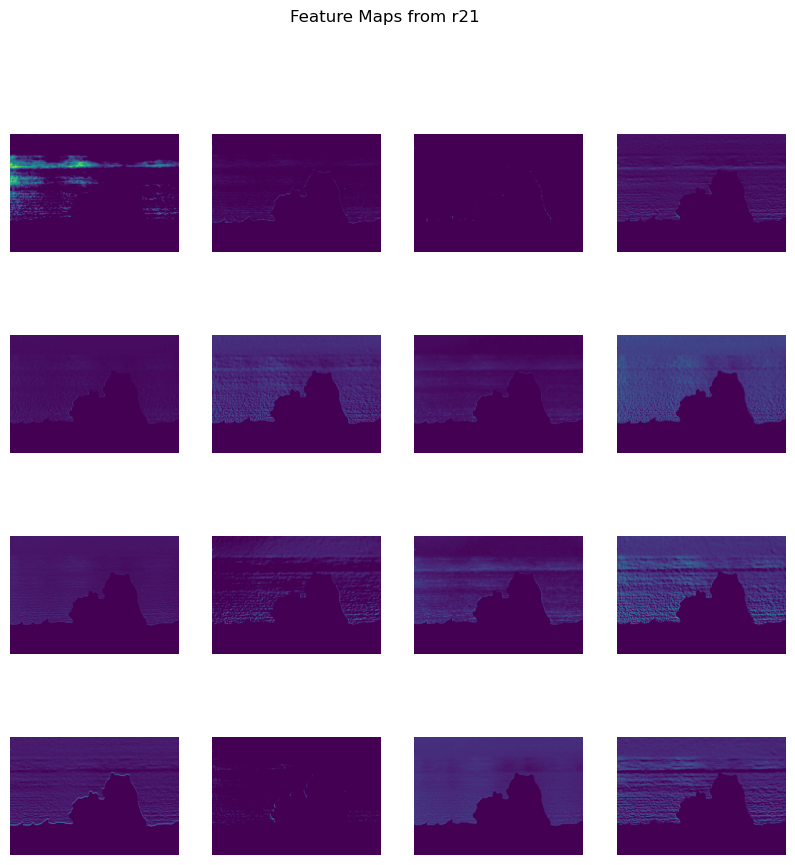

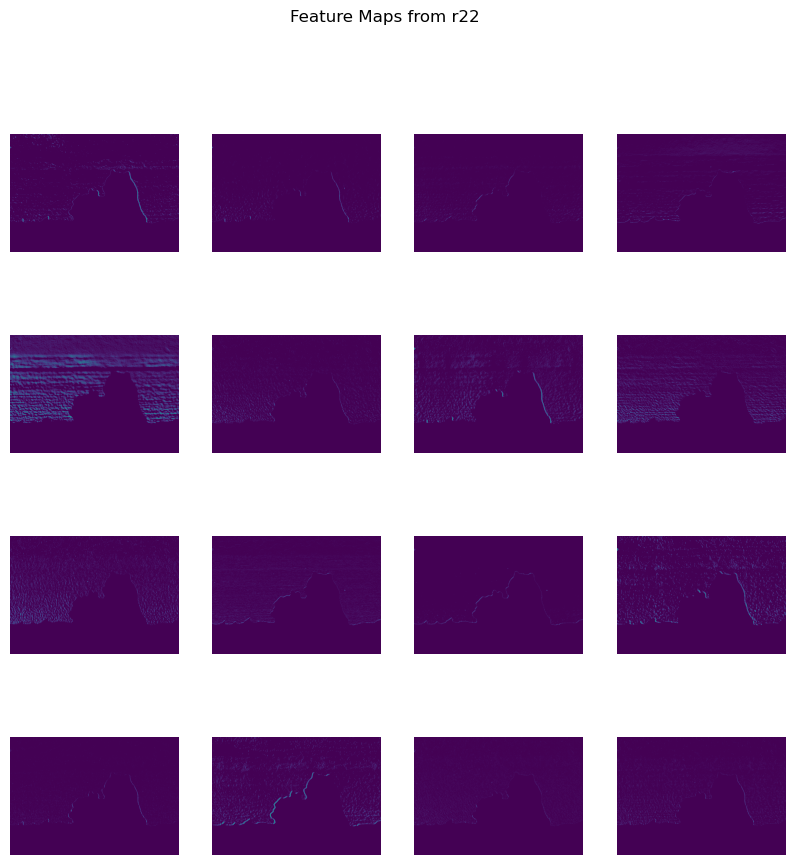

...

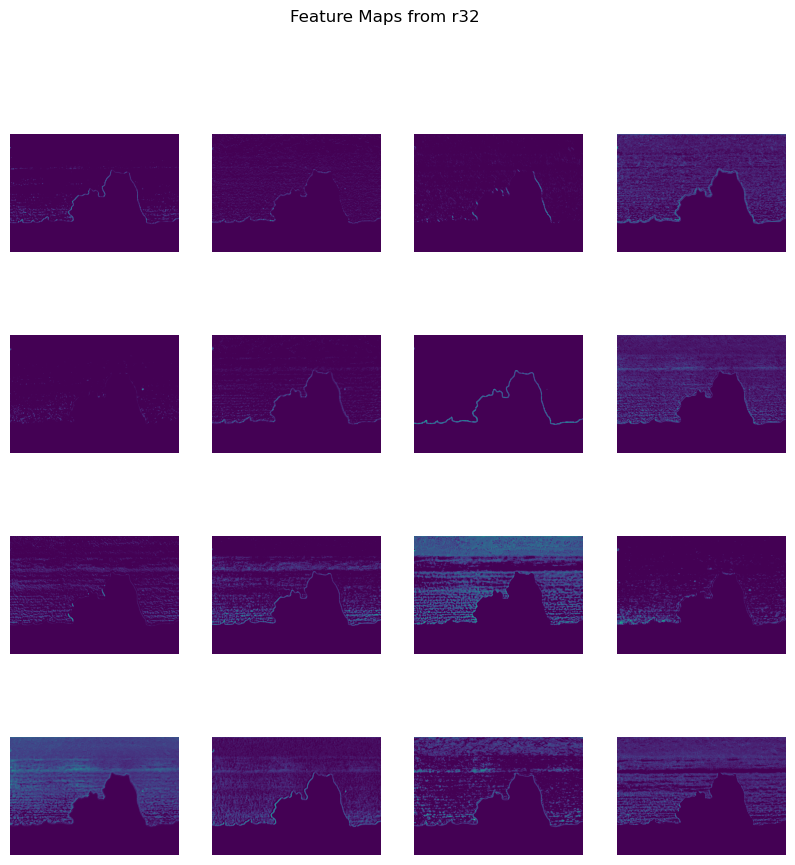

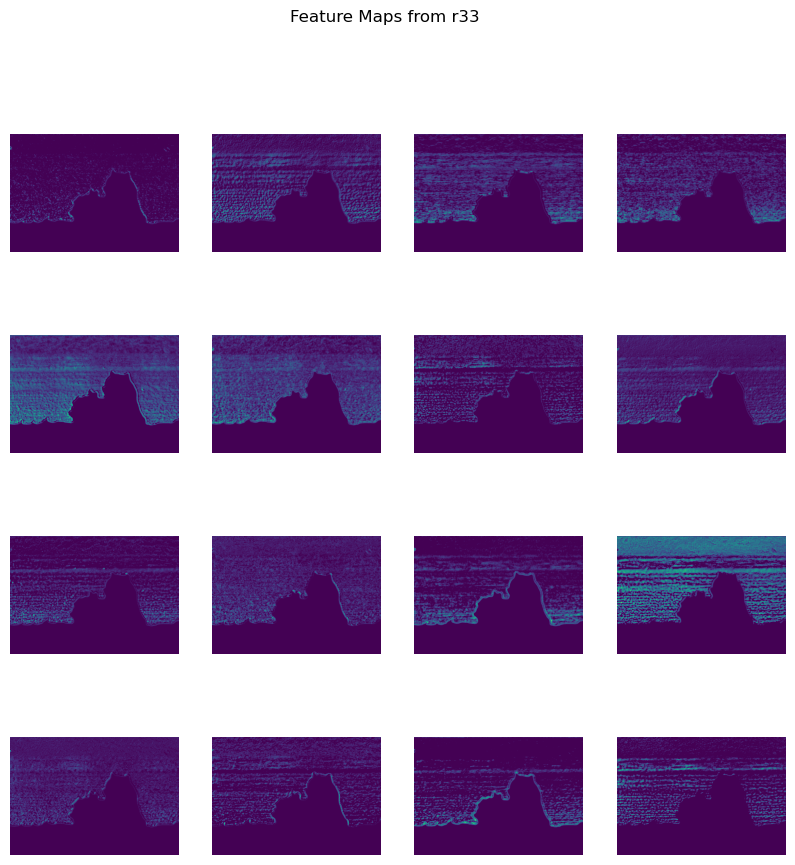

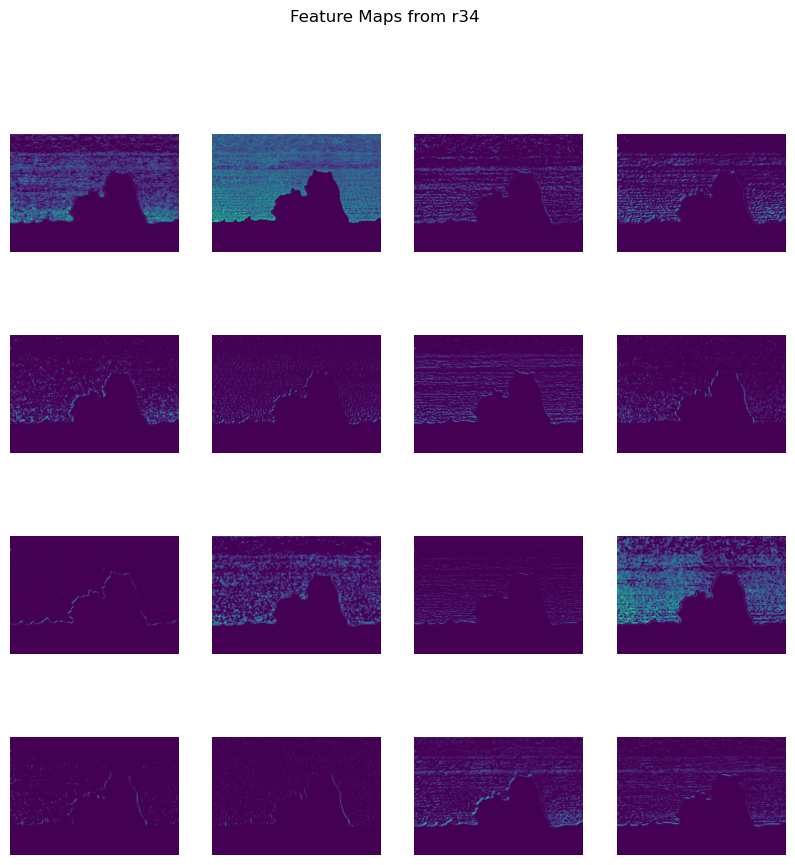

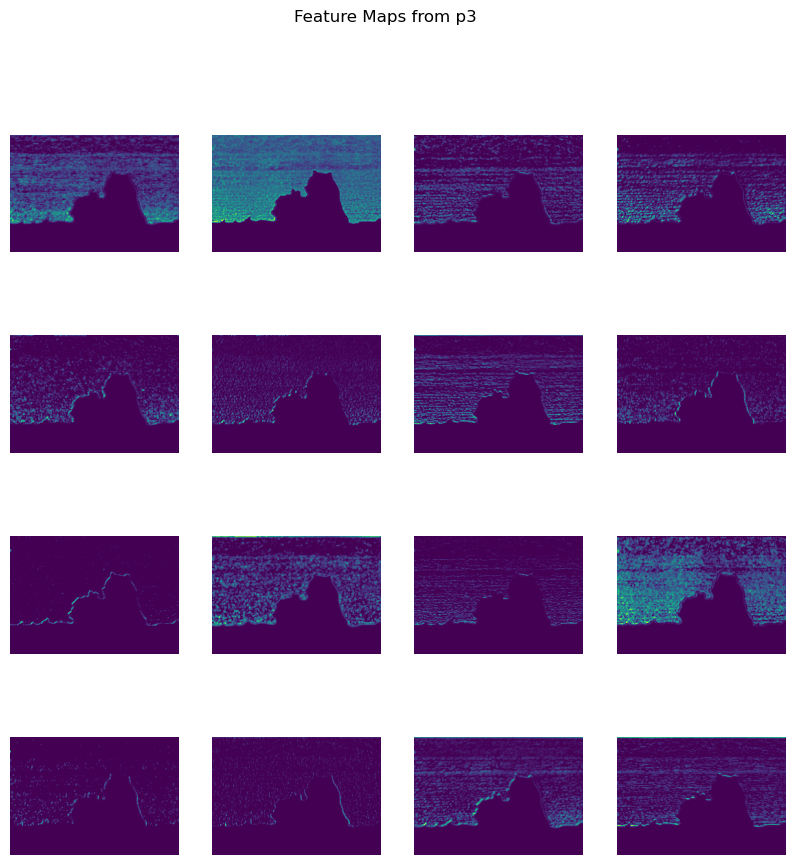

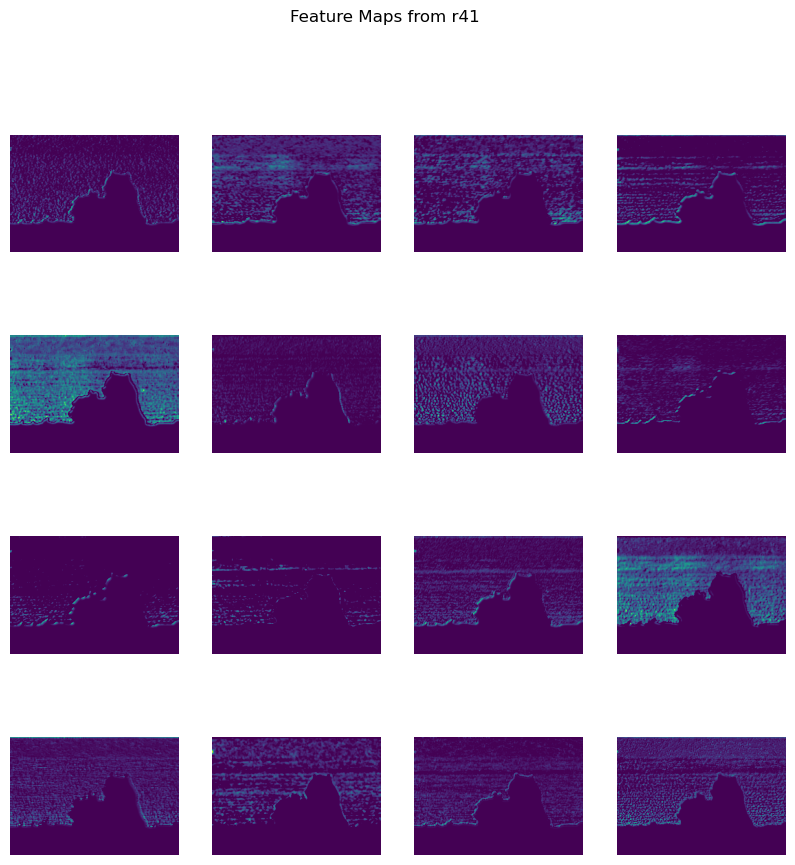

In [14]:
import torch
import torch.nn as nn
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from libs.models_masked import encoder4 as encoder_m, decoder4 as decoder_m

enc_ref_m = encoder_m()
enc_ref_m.load_state_dict(torch.load('models/vgg_r41.pth'))
enc_ref_m.eval() 

def preprocess_image(image_path):
    preprocess = transforms.Compose([
        transforms.ToTensor(), 
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) 
    ])
    
    img = Image.open(image_path).convert('RGB')
    img_tensor = preprocess(img).unsqueeze(0) 
    return img_tensor

def load_mask(mask_path):
    preprocess = transforms.Compose([
        transforms.ToTensor()
    ])
    
    mask_img = Image.open(mask_path).convert('L') 
    mask_tensor = preprocess(mask_img).unsqueeze(0) 
    mask_tensor = (mask_tensor > 0.5).float()
    
    mask_tensor = mask_tensor[:, 0:1, :, :]  
    return mask_tensor

def plot_feature_maps(feature_maps, num_maps=16):
    for layer_name, feature_map in feature_maps.items():
        num_filters = feature_map.shape[1]
        num_to_display = min(num_maps, num_filters)

        plt.figure(figsize=(10, 10))
        plt.suptitle(f"Feature Maps from {layer_name}")

        for i in range(num_to_display):
            ax = plt.subplot(4, 4, i + 1)
            plt.imshow(feature_map[0, i].cpu().detach().numpy(), cmap='viridis')
            plt.axis('off')
        plt.show()

def extract_features_with_mask(image_tensor, mask_tensor, encoder):
    with torch.no_grad():
        features, updated_mask = encoder(image_tensor, mask_tensor)
    return features, updated_mask

image_path = 'sources/image-2.png'  
input_image = preprocess_image(image_path)

mask_path = 'mask.jpg' 
mask_tensor = load_mask(mask_path)

features, updated_mask = extract_features_with_mask(input_image, mask_tensor, enc_ref_m)

plot_feature_maps(features, num_maps=16)


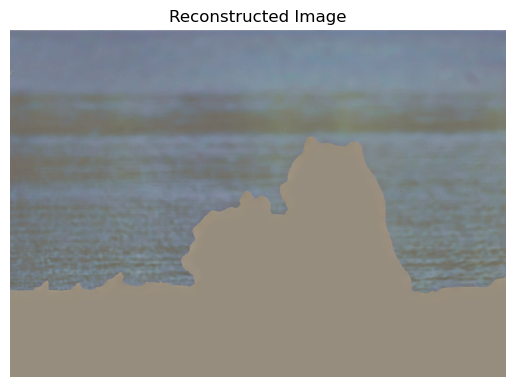

In [15]:
from libs.models_masked import decoder4 as decoder_m

dec_ref_m = decoder_m()
dec_ref_m.load_state_dict(torch.load('./models/dec_r41.pth'))

# Function to de-process the image for visualization
def deprocess_image(image_tensor):
    img = image_tensor.clone().detach()
    img = img.squeeze(0)  # Remove batch dimension
    img = img.permute(1, 2, 0).cpu().numpy()  # Convert from (C, H, W) to (H, W, C)
    img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # De-normalize
    img = np.clip(img, 0, 1)
    return img

# Function to plot an image
def plot_image(image_tensor, title="Image"):
    img = deprocess_image(image_tensor)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Decoding the features to reconstruct the image
with torch.no_grad():
    reconstructed_image = dec_ref_m(features['r41'])  # Use the highest-level feature map 'r41'

# Plot the reconstructed image
plot_image(reconstructed_image, title="Reconstructed Image")